# Common Analysis

This project will analyze wildfire data from a specific city in the United States. The focus of this project is to study the impacts of wildfires in the United States by analyzing air quality and estimated smoke volume. Hopefully, this project could derive actionable insights to help mitigate the effects of wildfires in the future.

## Setup
The following sections will perform setup actions, including loading the necessary libaries, defining constants, and creating a sign-up request for the API that will be used later on in this notebook. All non-original code used in this notebook was developed by Dr. David W. McDonald for use in DATA 512, a course in the UW MS Data Science degree program. Appropriate attributions will be given before each section of code that I have adapted. This code is provided under the [Creative Commons](https://creativecommons.org) [CC-BY license](https://creativecommons.org/licenses/by/4.0/). Revision 1.1 - September 5, 2023

### Load Libraries and Constants
First, we will load all required libraries and define constants to be used for data extraction and API calls. Most of the code and in-line comments can be attributed to Dr. David McDonald, under the previously mentioned Creative Commons license.

In [463]:
#
#    IMPORTS
# 

#    Import some standard python modules
import os, json, time
#
#    The module pyproj is a standard module that can be installed using pip or your other favorite
#    installation tool. This module provides tools to convert between different geodesic coordinate systems
#    and for calculating distances between points (coordinates) in a specific geodesic system.
#
from pyproj import Transformer, Geod
#
#    The 'wildfire' module is a user module. This module is available from the course website. The module
#    includes one object, a Reader, that can be used to read the GeoJSON files associated with the
#    wildefire dataset. The module also contains a sample datafile that is GeoJSON compliant and that
#    contains a small number of California wildfires extracted from the main wildfire dataset.
#    
from wildfire.Reader import Reader as WFReader
#
#    The 'requests' module is a distribution module for making web requests.
#
import requests
#
#    Import the usual Python data science libraries
#
import pandas as pd, numpy as np, matplotlib.pyplot as plt
pd.options.mode.chained_assignment = None  # default='warn'
#
#    We will be using the datetime library to handle some date fields later on
#
from datetime import datetime
#
#    We will be using an ARIMA model to make predictions on smoke estimates
#
from statsmodels.tsa.arima.model import ARIMA
#
#   Ignore inconsequential warnings that may appear
#
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning, ValueWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.simplefilter('ignore', ValueWarning)

In [3]:
#
#    CONSTANTS
#

# This is a constant for the JSON file that we are parsing information from
SAMPLE_DATA_FILENAME = "USGS_Wildland_Fire_Combined_Dataset.json"
#
#    A dictionary representing our assigned city of Idaho Falls to study wildfire data
ASSIGNED_CITY = {'city'   : 'Idaho Falls',
                 'county' : 'Bonneville',
                 'state'  : 'Idaho',
                 'fips'   : '16019',
                 'latlon' : [43.5, -112.033333]}
#
#    This is the root of all AQS API URLs
#
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'

#
#    These are 'actions' we can ask the API to take or requests that we can make of the API
#
#    Sign-up request - generally only performed once - unless you lose your key
API_ACTION_SIGNUP = '/signup?email={email}'
#
#    List actions provide information on API parameter values that are required by some other actions/requests
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'
API_ACTION_LIST_SITES = '/list/sitesByCounty?email={email}&key={key}&state={state}&county={county}'
#
#    Monitor actions are requests for monitoring stations that meet specific criteria
API_ACTION_MONITORS_COUNTY = '/monitors/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_MONITORS_BOX = '/monitors/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    Summary actions are requests for summary data. These are for daily summaries
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_DAILY_SUMMARY_BOX = '/dailyData/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'
#
#    It is always nice to be respectful of a free data resource.
#    We're going to observe a 100 requests per minute limit - which is fairly nice
API_LATENCY_ASSUMED = 0.002       # Assuming roughly 2ms latency on the API and network
API_THROTTLE_WAIT = (1.0/100.0)-API_LATENCY_ASSUMED
#
#
#    This is a template that covers most of the parameters for the actions we might take, from the set of actions
#    above. In the examples below, most of the time parameters can either be supplied as individual values to a
#    function - or they can be set in a copy of the template and passed in with the template.
# 
AQS_REQUEST_TEMPLATE = {
    "email":      "",     
    "key":        "",      
    "state":      "",     # the two digit state FIPS # as a string
    "county":     "",     # the three digit county FIPS # as a string
    "begin_date": "",     # the start of a time window in YYYYMMDD format
    "end_date":   "",     # the end of a time window in YYYYMMDD format, begin_date and end_date must be in the same year
    "minlat":    0.0,
    "maxlat":    0.0,
    "minlon":    0.0,
    "maxlon":    0.0,
    "param":     "",     # a list of comma separated 5 digit codes, max 5 codes requested
    "pclass":    ""      # parameter class is only used by the List calls
}

#
#   When performing the API calls, we have to split the number of parameter codes,
#   as there can only be a max of 5 codes per request
#
#   Gaseous AQI pollutants CO, SO2, NO2, and O2
AQI_PARAMS_GASEOUS = "42101,42401,42602,44201"
#
#   Particulate AQI pollutants PM10, PM2.5, and Acceptable PM2.5
AQI_PARAMS_PARTICULATES = "81102,88101,88502"
#   
#

### Making a sign-up request

To use the API, you need a key, which you obtain from signing up with an email. We will reuse a function created by David McDonald, which initiates a sign-up request to the AQI API. Then, assumiing the user has not done a sign-up request, we perform a request, and then we set a username and key based on the information they sent to the user. As before, tbe following code chunks are provided under a Creative Commons CC-BY License.

In [196]:
#
#    This implements the sign-up request. The parameters are standardized so that this function definition matches
#    all of the others. However, the easiest way to call this is to simply call this function with your preferred
#    email address.
#
def request_signup(email_address = None,
                   endpoint_url = API_REQUEST_URL, 
                   endpoint_action = API_ACTION_SIGNUP, 
                   request_template = AQS_REQUEST_TEMPLATE,
                   headers = None):
    
    # Make sure we have a string - if you don't have access to this email addres, things might go badly for you
    if email_address:
        request_template['email'] = email_address        
    if not request_template['email']: 
        raise Exception("Must supply an email address to call 'request_signup()'")
    
    # Compose the signup url - create a request URL by combining the endpoint_url with the parameters for the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

In [ ]:
#
#    A SIGNUP request is only to be done once, to request a key. A key is sent to that email address and needs to be confirmed with a click through
#    This code should probably be commented out after you've made your key request to make sure you don't accidentally make a new sign-up request
#
#print("Requesting SIGNUP ...")
#response = request_signup("mrqs97@uw.edu")
#print(json.dumps(response,indent=4))
#

In [4]:
#
#   Once we have the signup email, we can define two constants
#   USERNAME - This should be the email address you sent the EPA asking for access to the API during sign-up
#   APIKEY   - This should be the authorization key they sent you

#   You can specify these as constants for your own use - just don't distribute the notebook without removing the constants
#
USERNAME = "mrqs97@uw.edu"
APIKEY = "bayfrog97"


## Load and Extract Data using the Reader Object

We will now use the user library `wildfire` to load up the JSON file containing our wildfire data. Then we will iterate through the data using a Reader object from the `wildfire` library, and append the resulting dictionary to a list that contains the records for each fire in our dataset. Once again, we are using code that is adapted from Dr. David McDonald under the Creative Commons CC-BY license.

In [4]:
#
#    This bit of code opens a new wildfire reader, gets the header information and prints it to the screen
#
print(f"Attempting to open '{SAMPLE_DATA_FILENAME}' with wildfire.Reader() object")
wfreader = WFReader(SAMPLE_DATA_FILENAME)

Attempting to open 'USGS_Wildland_Fire_Combined_Dataset.json' with wildfire.Reader() object

The header has the following keys:
['displayFieldName', 'fieldAliases', 'geometryType', 'spatialReference', 'fields']

Header Dictionary
{
    "displayFieldName": "",
    "fieldAliases": {
        "OBJECTID": "OBJECTID",
        "USGS_Assigned_ID": "USGS Assigned ID",
        "Assigned_Fire_Type": "Assigned Fire Type",
        "Fire_Year": "Fire Year",
        "Fire_Polygon_Tier": "Fire Polygon Tier",
        "Fire_Attribute_Tiers": "Fire Attribute Tiers",
        "GIS_Acres": "GIS_Acres",
        "GIS_Hectares": "GIS_Hectares",
        "Source_Datasets": "Source Datasets",
        "Listed_Fire_Types": "Listed Fire Types",
        "Listed_Fire_Names": "Listed Fire Names",
        "Listed_Fire_Codes": "Listed Fire Codes",
        "Listed_Fire_IDs": "Listed Fire IDs",
        "Listed_Fire_IRWIN_IDs": "Listed Fire IRWIN IDs",
        "Listed_Fire_Dates": "Listed Fire Dates",
        "Listed_Fire_C

In [5]:
#
#    This sample code will load the whole sample file, or a small amount of the complete dataset.
#
feature_list = list()
feature_count = 0
# A rewind() on the reader object makes sure we're at the start of the feature list
# This way, we can execute this cell multiple times and get the same result 
wfreader.rewind()
# Now, read through each of the features, saving them as dictionaries into a list
feature = wfreader.next()
while feature:
    feature_list.append(feature)
    feature_count += 1
    # if we're loading a lot of features, print progress
    if (feature_count % 1000) == 0:
        print(f"Loaded {feature_count} features")
    feature = wfreader.next()
#
#    Print the number of items (features) we think we loaded
print(f"Loaded a total of {feature_count} features")
#
#    Just a validation check - did all the items we loaded get into the list?
print(f"Variable 'feature_list' contains {len(feature_list)} features")




Loaded 100 features
Loaded 200 features
Loaded 300 features
Loaded 400 features
Loaded 500 features
Loaded 600 features
Loaded 700 features
Loaded 800 features
Loaded 900 features
Loaded 1000 features
Loaded 1100 features
Loaded 1200 features
Loaded 1300 features
Loaded 1400 features
Loaded 1500 features
Loaded 1600 features
Loaded 1700 features
Loaded 1800 features
Loaded 1900 features
Loaded 2000 features
Loaded 2100 features
Loaded 2200 features
Loaded 2300 features
Loaded 2400 features
Loaded 2500 features
Loaded 2600 features
Loaded 2700 features
Loaded 2800 features
Loaded 2900 features
Loaded 3000 features
Loaded 3100 features
Loaded 3200 features
Loaded 3300 features
Loaded 3400 features
Loaded 3500 features
Loaded 3600 features
Loaded 3700 features
Loaded 3800 features
Loaded 3900 features
Loaded 4000 features
Loaded 4100 features
Loaded 4200 features
Loaded 4300 features
Loaded 4400 features
Loaded 4500 features
Loaded 4600 features
Loaded 4700 features
Loaded 4800 features
L

Loaded 38000 features
Loaded 38100 features
Loaded 38200 features
Loaded 38300 features
Loaded 38400 features
Loaded 38500 features
Loaded 38600 features
Loaded 38700 features
Loaded 38800 features
Loaded 38900 features
Loaded 39000 features
Loaded 39100 features
Loaded 39200 features
Loaded 39300 features
Loaded 39400 features
Loaded 39500 features
Loaded 39600 features
Loaded 39700 features
Loaded 39800 features
Loaded 39900 features
Loaded 40000 features
Loaded 40100 features
Loaded 40200 features
Loaded 40300 features
Loaded 40400 features
Loaded 40500 features
Loaded 40600 features
Loaded 40700 features
Loaded 40800 features
Loaded 40900 features
Loaded 41000 features
Loaded 41100 features
Loaded 41200 features
Loaded 41300 features
Loaded 41400 features
Loaded 41500 features
Loaded 41600 features
Loaded 41700 features
Loaded 41800 features
Loaded 41900 features
Loaded 42000 features
Loaded 42100 features
Loaded 42200 features
Loaded 42300 features
Loaded 42400 features
Loaded 425

Loaded 75300 features
Loaded 75400 features
Loaded 75500 features
Loaded 75600 features
Loaded 75700 features
Loaded 75800 features
Loaded 75900 features
Loaded 76000 features
Loaded 76100 features
Loaded 76200 features
Loaded 76300 features
Loaded 76400 features
Loaded 76500 features
Loaded 76600 features
Loaded 76700 features
Loaded 76800 features
Loaded 76900 features
Loaded 77000 features
Loaded 77100 features
Loaded 77200 features
Loaded 77300 features
Loaded 77400 features
Loaded 77500 features
Loaded 77600 features
Loaded 77700 features
Loaded 77800 features
Loaded 77900 features
Loaded 78000 features
Loaded 78100 features
Loaded 78200 features
Loaded 78300 features
Loaded 78400 features
Loaded 78500 features
Loaded 78600 features
Loaded 78700 features
Loaded 78800 features
Loaded 78900 features
Loaded 79000 features
Loaded 79100 features
Loaded 79200 features
Loaded 79300 features
Loaded 79400 features
Loaded 79500 features
Loaded 79600 features
Loaded 79700 features
Loaded 798

Loaded 112000 features
Loaded 112100 features
Loaded 112200 features
Loaded 112300 features
Loaded 112400 features
Loaded 112500 features
Loaded 112600 features
Loaded 112700 features
Loaded 112800 features
Loaded 112900 features
Loaded 113000 features
Loaded 113100 features
Loaded 113200 features
Loaded 113300 features
Loaded 113400 features
Loaded 113500 features
Loaded 113600 features
Loaded 113700 features
Loaded 113800 features
Loaded 113900 features
Loaded 114000 features
Loaded 114100 features
Loaded 114200 features
Loaded 114300 features
Loaded 114400 features
Loaded 114500 features
Loaded 114600 features
Loaded 114700 features
Loaded 114800 features
Loaded 114900 features
Loaded 115000 features
Loaded 115100 features
Loaded 115200 features
Loaded 115300 features
Loaded 115400 features
Loaded 115500 features
Loaded 115600 features
Loaded 115700 features
Loaded 115800 features
Loaded 115900 features
Loaded 116000 features
Loaded 116100 features
Loaded 116200 features
Loaded 1163

## Computing distance between a place and a wildfire

Now that we have extracted our data into a list of features, we need to extract the coordinates for the perimeter points of each fire and calculate the distance for each point to our assigned city of Idaho Falls. The functions for converting ring coordinates and calculating distance have been provided by Dr. David McDonald under the Creative Commons CC-BY License.

First, lets take a look at our list of features to better understand the data contained inside.

In [5]:
# Let's take a look at the first feature to see what it contains
feature_list[0]

NameError: name 'feature_list' is not defined

### Converting Coordinates
Note that each feature in the list contains a `'geometry'` key. This represents a list of coordinates for perimeter points of each fire. We are going to convert these coordinates to EPSG:4326 coordinates to be consistent with the latitude and longitude coordinate points of our assigned city. This will be useful later on when we are calculting the distance between our city coordinates and the coordinates of different points on the ring.

In [10]:
#
#    Transform feature geometry data
#
#    The function takes one parameter, a list of ESRI:102008 coordinates that will be transformed to EPSG:4326
#    The function returns a list of coordinates in EPSG:4326
def convert_ring_to_epsg4326(ring_data=None):
    converted_ring = list()
    #
    # We use a pyproj transformer that converts from ESRI:102008 to EPSG:4326 to transform the list of coordinates
    to_epsg4326 = Transformer.from_crs("ESRI:102008","EPSG:4326")
    # We'll run through the list transforming each ESRI:102008 x,y coordinate into a decimal degree lat,lon
    for coord in ring_data:
        lat,lon = to_epsg4326.transform(coord[0],coord[1])
        new_coord = lat,lon
        converted_ring.append(new_coord)
    return converted_ring

### Create Distance Function
Deciding on a distance measurement between a city and a wildfire is non-trivial. A wildfire can amass a wide area, so how do we determine the distance of the fire to a city? One way we can approach this is to calculate the average distance of perimeter points from the fire to roughly estimate the centroid of each fire. The following code calculates the distance to each coordinate point on the perimeter of the fire and averages those distances to create this rough estimate.

In [198]:
#    
#    The function takes two parameters
#        A place - which is coordinate point (list or tuple with two items, (lat,lon) in decimal degrees EPSG:4326
#        Ring_data - a list of decimal degree coordinates for the fire boundary
#
#    The function returns the average miles from boundary to the place
#
def average_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    # create a list to store our results
    distances_in_meters = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        distances_in_meters.append(d[2])
    # convert meters to miles
    distances_in_miles = [meters*0.00062137 for meters in distances_in_meters]
    # the esri polygon shape (the ring) requires that the first and last coordinates be identical to 'close the region
    # we remove one of them so that we don't bias our average by having two of the same point
    distances_in_miles_no_dup = distances_in_miles[1:]
    # now, average miles
    average = sum(distances_in_miles_no_dup)/len(distances_in_miles_no_dup)
    return average



### Calculate Distance for Each Fire to Idaho Falls
Now that we have defined a function for calculating distance, we need to iterate through the list of features (individual fires) and calculate the distance from each fire to the city of Idaho Falls. Then we will append this to a list of dictionaries that contain the data for each fire. There are a few caveats:
- We are only choosing fires from 1963 onwards
- We are only considering fires within 1250 miles of Idaho Falls

In [130]:
# Initialize an empty list that will be appended for each fire that satisfies the specified criteria
valid_fires = list()

for i in range(0, len(feature_list)):
    # It can take several hours to iterate through all records, so I have included a print statement on the iteration
    # index to notify the user of their progress. For reference, there are 135060 records in the feature list
    print(i)
    wf_feature = feature_list[i]
    if wf_feature['attributes']['Fire_Year'] >= 1963: # Filter for fires on or after 1963
        #
        # A few records do not have a "rings" attribute, so we will omit these from our analysis by
        # checking for the existence of that attribute
        if 'rings' in wf_feature['geometry']:
            #
            # The first index contains the largest ring, which is what we will consider
            ring_data = wf_feature['geometry']['rings'][0]
            distance = average_distance_from_place_to_fire_perimeter(ASSIGNED_CITY['latlon'],ring_data)
            if distance <= 1250: # Filter for fires within 1250 miles of Idaho Falls
                #
                # Extract the year, name, number of acres, and type of fire. Then append this information
                # (along with distance to Idaho Falls) to our list of valid fires
                wf_year = wf_feature['attributes']['Fire_Year']
                wf_name = wf_feature['attributes']['Listed_Fire_Names'].split(',')[0]
                wf_size = wf_feature['attributes']['GIS_Acres']
                wf_type = wf_feature['attributes']['Assigned_Fire_Type']
                valid_fires.append({'Year': wf_year,
                                    'Name': wf_name,
                                    'Acres': wf_size,
                                    'Fire_Type': wf_type,
                                    'Distance_(mi)': distance})


113766
113767
113768
113769
113770
113771
113772
113773
113774
113775
113776
113777
113778
113779
113780
113781
113782
113783
113784
113785
113786
113787
113788
113789
113790
113791
113792
113793
113794
113795
113796
113797
113798
113799
113800
113801
113802
113803
113804
113805
113806
113807
113808
113809
113810
113811
113812
113813
113814
113815
113816
113817
113818
113819
113820
113821
113822
113823
113824
113825
113826
113827
113828
113829
113830
113831
113832
113833
113834
113835
113836
113837
113838
113839
113840
113841
113842
113843
113844
113845
113846
113847
113848
113849
113850
113851
113852
113853
113854
113855
113856
113857
113858
113859
113860
113861
113862
113863
113864
113865
113866
113867
113868
113869
113870
113871
113872
113873
113874
113875
113876
113877
113878
113879
113880
113881
113882
113883
113884
113885
113886
113887
113888
113889
113890
113891
113892
113893
113894
113895
113896
113897
113898
113899
113900
113901
113902
113903
113904
113905
113906
113907
113908

114939
114940
114941
114942
114943
114944
114945
114946
114947
114948
114949
114950
114951
114952
114953
114954
114955
114956
114957
114958
114959
114960
114961
114962
114963
114964
114965
114966
114967
114968
114969
114970
114971
114972
114973
114974
114975
114976
114977
114978
114979
114980
114981
114982
114983
114984
114985
114986
114987
114988
114989
114990
114991
114992
114993
114994
114995
114996
114997
114998
114999
115000
115001
115002
115003
115004
115005
115006
115007
115008
115009
115010
115011
115012
115013
115014
115015
115016
115017
115018
115019
115020
115021
115022
115023
115024
115025
115026
115027
115028
115029
115030
115031
115032
115033
115034
115035
115036
115037
115038
115039
115040
115041
115042
115043
115044
115045
115046
115047
115048
115049
115050
115051
115052
115053
115054
115055
115056
115057
115058
115059
115060
115061
115062
115063
115064
115065
115066
115067
115068
115069
115070
115071
115072
115073
115074
115075
115076
115077
115078
115079
115080
115081

116114
116115
116116
116117
116118
116119
116120
116121
116122
116123
116124
116125
116126
116127
116128
116129
116130
116131
116132
116133
116134
116135
116136
116137
116138
116139
116140
116141
116142
116143
116144
116145
116146
116147
116148
116149
116150
116151
116152
116153
116154
116155
116156
116157
116158
116159
116160
116161
116162
116163
116164
116165
116166
116167
116168
116169
116170
116171
116172
116173
116174
116175
116176
116177
116178
116179
116180
116181
116182
116183
116184
116185
116186
116187
116188
116189
116190
116191
116192
116193
116194
116195
116196
116197
116198
116199
116200
116201
116202
116203
116204
116205
116206
116207
116208
116209
116210
116211
116212
116213
116214
116215
116216
116217
116218
116219
116220
116221
116222
116223
116224
116225
116226
116227
116228
116229
116230
116231
116232
116233
116234
116235
116236
116237
116238
116239
116240
116241
116242
116243
116244
116245
116246
116247
116248
116249
116250
116251
116252
116253
116254
116255
116256

117287
117288
117289
117290
117291
117292
117293
117294
117295
117296
117297
117298
117299
117300
117301
117302
117303
117304
117305
117306
117307
117308
117309
117310
117311
117312
117313
117314
117315
117316
117317
117318
117319
117320
117321
117322
117323
117324
117325
117326
117327
117328
117329
117330
117331
117332
117333
117334
117335
117336
117337
117338
117339
117340
117341
117342
117343
117344
117345
117346
117347
117348
117349
117350
117351
117352
117353
117354
117355
117356
117357
117358
117359
117360
117361
117362
117363
117364
117365
117366
117367
117368
117369
117370
117371
117372
117373
117374
117375
117376
117377
117378
117379
117380
117381
117382
117383
117384
117385
117386
117387
117388
117389
117390
117391
117392
117393
117394
117395
117396
117397
117398
117399
117400
117401
117402
117403
117404
117405
117406
117407
117408
117409
117410
117411
117412
117413
117414
117415
117416
117417
117418
117419
117420
117421
117422
117423
117424
117425
117426
117427
117428
117429

118461
118462
118463
118464
118465
118466
118467
118468
118469
118470
118471
118472
118473
118474
118475
118476
118477
118478
118479
118480
118481
118482
118483
118484
118485
118486
118487
118488
118489
118490
118491
118492
118493
118494
118495
118496
118497
118498
118499
118500
118501
118502
118503
118504
118505
118506
118507
118508
118509
118510
118511
118512
118513
118514
118515
118516
118517
118518
118519
118520
118521
118522
118523
118524
118525
118526
118527
118528
118529
118530
118531
118532
118533
118534
118535
118536
118537
118538
118539
118540
118541
118542
118543
118544
118545
118546
118547
118548
118549
118550
118551
118552
118553
118554
118555
118556
118557
118558
118559
118560
118561
118562
118563
118564
118565
118566
118567
118568
118569
118570
118571
118572
118573
118574
118575
118576
118577
118578
118579
118580
118581
118582
118583
118584
118585
118586
118587
118588
118589
118590
118591
118592
118593
118594
118595
118596
118597
118598
118599
118600
118601
118602
118603

119634
119635
119636
119637
119638
119639
119640
119641
119642
119643
119644
119645
119646
119647
119648
119649
119650
119651
119652
119653
119654
119655
119656
119657
119658
119659
119660
119661
119662
119663
119664
119665
119666
119667
119668
119669
119670
119671
119672
119673
119674
119675
119676
119677
119678
119679
119680
119681
119682
119683
119684
119685
119686
119687
119688
119689
119690
119691
119692
119693
119694
119695
119696
119697
119698
119699
119700
119701
119702
119703
119704
119705
119706
119707
119708
119709
119710
119711
119712
119713
119714
119715
119716
119717
119718
119719
119720
119721
119722
119723
119724
119725
119726
119727
119728
119729
119730
119731
119732
119733
119734
119735
119736
119737
119738
119739
119740
119741
119742
119743
119744
119745
119746
119747
119748
119749
119750
119751
119752
119753
119754
119755
119756
119757
119758
119759
119760
119761
119762
119763
119764
119765
119766
119767
119768
119769
119770
119771
119772
119773
119774
119775
119776

120805
120806
120807
120808
120809
120810
120811
120812
120813
120814
120815
120816
120817
120818
120819
120820
120821
120822
120823
120824
120825
120826
120827
120828
120829
120830
120831
120832
120833
120834
120835
120836
120837
120838
120839
120840
120841
120842
120843
120844
120845
120846
120847
120848
120849
120850
120851
120852
120853
120854
120855
120856
120857
120858
120859
120860
120861
120862
120863
120864
120865
120866
120867
120868
120869
120870
120871
120872
120873
120874
120875
120876
120877
120878
120879
120880
120881
120882
120883
120884
120885
120886
120887
120888
120889
120890
120891
120892
120893
120894
120895
120896
120897
120898
120899
120900
120901
120902
120903
120904
120905
120906
120907
120908
120909
120910
120911
120912
120913
120914
120915
120916
120917
120918
120919
120920
120921
120922
120923
120924
120925
120926
120927
120928
120929
120930
120931
120932
120933
120934
120935
120936
120937
120938
120939
120940
120941
120942
120943
120944
120945
120946
120947

121979
121980
121981
121982
121983
121984
121985
121986
121987
121988
121989
121990
121991
121992
121993
121994
121995
121996
121997
121998
121999
122000
122001
122002
122003
122004
122005
122006
122007
122008
122009
122010
122011
122012
122013
122014
122015
122016
122017
122018
122019
122020
122021
122022
122023
122024
122025
122026
122027
122028
122029
122030
122031
122032
122033
122034
122035
122036
122037
122038
122039
122040
122041
122042
122043
122044
122045
122046
122047
122048
122049
122050
122051
122052
122053
122054
122055
122056
122057
122058
122059
122060
122061
122062
122063
122064
122065
122066
122067
122068
122069
122070
122071
122072
122073
122074
122075
122076
122077
122078
122079
122080
122081
122082
122083
122084
122085
122086
122087
122088
122089
122090
122091
122092
122093
122094
122095
122096
122097
122098
122099
122100
122101
122102
122103
122104
122105
122106
122107
122108
122109
122110
122111
122112
122113
122114
122115
122116
122117
122118
122119
122120
122121

123154
123155
123156
123157
123158
123159
123160
123161
123162
123163
123164
123165
123166
123167
123168
123169
123170
123171
123172
123173
123174
123175
123176
123177
123178
123179
123180
123181
123182
123183
123184
123185
123186
123187
123188
123189
123190
123191
123192
123193
123194
123195
123196
123197
123198
123199
123200
123201
123202
123203
123204
123205
123206
123207
123208
123209
123210
123211
123212
123213
123214
123215
123216
123217
123218
123219
123220
123221
123222
123223
123224
123225
123226
123227
123228
123229
123230
123231
123232
123233
123234
123235
123236
123237
123238
123239
123240
123241
123242
123243
123244
123245
123246
123247
123248
123249
123250
123251
123252
123253
123254
123255
123256
123257
123258
123259
123260
123261
123262
123263
123264
123265
123266
123267
123268
123269
123270
123271
123272
123273
123274
123275
123276
123277
123278
123279
123280
123281
123282
123283
123284
123285
123286
123287
123288
123289
123290
123291
123292
123293
123294
123295
123296

124327
124328
124329
124330
124331
124332
124333
124334
124335
124336
124337
124338
124339
124340
124341
124342
124343
124344
124345
124346
124347
124348
124349
124350
124351
124352
124353
124354
124355
124356
124357
124358
124359
124360
124361
124362
124363
124364
124365
124366
124367
124368
124369
124370
124371
124372
124373
124374
124375
124376
124377
124378
124379
124380
124381
124382
124383
124384
124385
124386
124387
124388
124389
124390
124391
124392
124393
124394
124395
124396
124397
124398
124399
124400
124401
124402
124403
124404
124405
124406
124407
124408
124409
124410
124411
124412
124413
124414
124415
124416
124417
124418
124419
124420
124421
124422
124423
124424
124425
124426
124427
124428
124429
124430
124431
124432
124433
124434
124435
124436
124437
124438
124439
124440
124441
124442
124443
124444
124445
124446
124447
124448
124449
124450
124451
124452
124453
124454
124455
124456
124457
124458
124459
124460
124461
124462
124463
124464
124465
124466
124467
124468
124469

125500
125501
125502
125503
125504
125505
125506
125507
125508
125509
125510
125511
125512
125513
125514
125515
125516
125517
125518
125519
125520
125521
125522
125523
125524
125525
125526
125527
125528
125529
125530
125531
125532
125533
125534
125535
125536
125537
125538
125539
125540
125541
125542
125543
125544
125545
125546
125547
125548
125549
125550
125551
125552
125553
125554
125555
125556
125557
125558
125559
125560
125561
125562
125563
125564
125565
125566
125567
125568
125569
125570
125571
125572
125573
125574
125575
125576
125577
125578
125579
125580
125581
125582
125583
125584
125585
125586
125587
125588
125589
125590
125591
125592
125593
125594
125595
125596
125597
125598
125599
125600
125601
125602
125603
125604
125605
125606
125607
125608
125609
125610
125611
125612
125613
125614
125615
125616
125617
125618
125619
125620
125621
125622
125623
125624
125625
125626
125627
125628
125629
125630
125631
125632
125633
125634
125635
125636
125637
125638
125639
125640
125641
125642

126672
126673
126674
126675
126676
126677
126678
126679
126680
126681
126682
126683
126684
126685
126686
126687
126688
126689
126690
126691
126692
126693
126694
126695
126696
126697
126698
126699
126700
126701
126702
126703
126704
126705
126706
126707
126708
126709
126710
126711
126712
126713
126714
126715
126716
126717
126718
126719
126720
126721
126722
126723
126724
126725
126726
126727
126728
126729
126730
126731
126732
126733
126734
126735
126736
126737
126738
126739
126740
126741
126742
126743
126744
126745
126746
126747
126748
126749
126750
126751
126752
126753
126754
126755
126756
126757
126758
126759
126760
126761
126762
126763
126764
126765
126766
126767
126768
126769
126770
126771
126772
126773
126774
126775
126776
126777
126778
126779
126780
126781
126782
126783
126784
126785
126786
126787
126788
126789
126790
126791
126792
126793
126794
126795
126796
126797
126798
126799
126800
126801
126802
126803
126804
126805
126806
126807
126808
126809
126810
126811
126812
126813
126814

127885
127886
127887
127888
127889
127890
127891
127892
127893
127894
127895
127896
127897
127898
127899
127900
127901
127902
127903
127904
127905
127906
127907
127908
127909
127910
127911
127912
127913
127914
127915
127916
127917
127918
127919
127920
127921
127922
127923
127924
127925
127926
127927
127928
127929
127930
127931
127932
127933
127934
127935
127936
127937
127938
127939
127940
127941
127942
127943
127944
127945
127946
127947
127948
127949
127950
127951
127952
127953
127954
127955
127956
127957
127958
127959
127960
127961
127962
127963
127964
127965
127966
127967
127968
127969
127970
127971
127972
127973
127974
127975
127976
127977
127978
127979
127980
127981
127982
127983
127984
127985
127986
127987
127988
127989
127990
127991
127992
127993
127994
127995
127996
127997
127998
127999
128000
128001
128002
128003
128004
128005
128006
128007
128008
128009
128010
128011
128012
128013
128014
128015
128016
128017
128018
128019
128020
128021
128022
128023
128024
128025
128026
128027

129059
129060
129061
129062
129063
129064
129065
129066
129067
129068
129069
129070
129071
129072
129073
129074
129075
129076
129077
129078
129079
129080
129081
129082
129083
129084
129085
129086
129087
129088
129089
129090
129091
129092
129093
129094
129095
129096
129097
129098
129099
129100
129101
129102
129103
129104
129105
129106
129107
129108
129109
129110
129111
129112
129113
129114
129115
129116
129117
129118
129119
129120
129121
129122
129123
129124
129125
129126
129127
129128
129129
129130
129131
129132
129133
129134
129135
129136
129137
129138
129139
129140
129141
129142
129143
129144
129145
129146
129147
129148
129149
129150
129151
129152
129153
129154
129155
129156
129157
129158
129159
129160
129161
129162
129163
129164
129165
129166
129167
129168
129169
129170
129171
129172
129173
129174
129175
129176
129177
129178
129179
129180
129181
129182
129183
129184
129185
129186
129187
129188
129189
129190
129191
129192
129193
129194
129195
129196
129197
129198
129199
129200
129201

130234
130235
130236
130237
130238
130239
130240
130241
130242
130243
130244
130245
130246
130247
130248
130249
130250
130251
130252
130253
130254
130255
130256
130257
130258
130259
130260
130261
130262
130263
130264
130265
130266
130267
130268
130269
130270
130271
130272
130273
130274
130275
130276
130277
130278
130279
130280
130281
130282
130283
130284
130285
130286
130287
130288
130289
130290
130291
130292
130293
130294
130295
130296
130297
130298
130299
130300
130301
130302
130303
130304
130305
130306
130307
130308
130309
130310
130311
130312
130313
130314
130315
130316
130317
130318
130319
130320
130321
130322
130323
130324
130325
130326
130327
130328
130329
130330
130331
130332
130333
130334
130335
130336
130337
130338
130339
130340
130341
130342
130343
130344
130345
130346
130347
130348
130349
130350
130351
130352
130353
130354
130355
130356
130357
130358
130359
130360
130361
130362
130363
130364
130365
130366
130367
130368
130369
130370
130371
130372
130373
130374
130375
130376

131409
131410
131411
131412
131413
131414
131415
131416
131417
131418
131419
131420
131421
131422
131423
131424
131425
131426
131427
131428
131429
131430
131431
131432
131433
131434
131435
131436
131437
131438
131439
131440
131441
131442
131443
131444
131445
131446
131447
131448
131449
131450
131451
131452
131453
131454
131455
131456
131457
131458
131459
131460
131461
131462
131463
131464
131465
131466
131467
131468
131469
131470
131471
131472
131473
131474
131475
131476
131477
131478
131479
131480
131481
131482
131483
131484
131485
131486
131487
131488
131489
131490
131491
131492
131493
131494
131495
131496
131497
131498
131499
131500
131501
131502
131503
131504
131505
131506
131507
131508
131509
131510
131511
131512
131513
131514
131515
131516
131517
131518
131519
131520
131521
131522
131523
131524
131525
131526
131527
131528
131529
131530
131531
131532
131533
131534
131535
131536
131537
131538
131539
131540
131541
131542
131543
131544
131545
131546
131547
131548
131549
131550
131551

132581
132582
132583
132584
132585
132586
132587
132588
132589
132590
132591
132592
132593
132594
132595
132596
132597
132598
132599
132600
132601
132602
132603
132604
132605
132606
132607
132608
132609
132610
132611
132612
132613
132614
132615
132616
132617
132618
132619
132620
132621
132622
132623
132624
132625
132626
132627
132628
132629
132630
132631
132632
132633
132634
132635
132636
132637
132638
132639
132640
132641
132642
132643
132644
132645
132646
132647
132648
132649
132650
132651
132652
132653
132654
132655
132656
132657
132658
132659
132660
132661
132662
132663
132664
132665
132666
132667
132668
132669
132670
132671
132672
132673
132674
132675
132676
132677
132678
132679
132680
132681
132682
132683
132684
132685
132686
132687
132688
132689
132690
132691
132692
132693
132694
132695
132696
132697
132698
132699
132700
132701
132702
132703
132704
132705
132706
132707
132708
132709
132710
132711
132712
132713
132714
132715
132716
132717
132718
132719
132720
132721
132722
132723

133755
133756
133757
133758
133759
133760
133761
133762
133763
133764
133765
133766
133767
133768
133769
133770
133771
133772
133773
133774
133775
133776
133777
133778
133779
133780
133781
133782
133783
133784
133785
133786
133787
133788
133789
133790
133791
133792
133793
133794
133795
133796
133797
133798
133799
133800
133801
133802
133803
133804
133805
133806
133807
133808
133809
133810
133811
133812
133813
133814
133815
133816
133817
133818
133819
133820
133821
133822
133823
133824
133825
133826
133827
133828
133829
133830
133831
133832
133833
133834
133835
133836
133837
133838
133839
133840
133841
133842
133843
133844
133845
133846
133847
133848
133849
133850
133851
133852
133853
133854
133855
133856
133857
133858
133859
133860
133861
133862
133863
133864
133865
133866
133867
133868
133869
133870
133871
133872
133873
133874
133875
133876
133877
133878
133879
133880
133881
133882
133883
133884
133885
133886
133887
133888
133889
133890
133891
133892
133893
133894
133895
133896
133897

134927
134928
134929
134930
134931
134932
134933
134934
134935
134936
134937
134938
134939
134940
134941
134942
134943
134944
134945
134946
134947
134948
134949
134950
134951
134952
134953
134954
134955
134956
134957
134958
134959
134960
134961
134962
134963
134964
134965
134966
134967
134968
134969
134970
134971
134972
134973
134974
134975
134976
134977
134978
134979
134980
134981
134982
134983
134984
134985
134986
134987
134988
134989
134990
134991
134992
134993
134994
134995
134996
134997
134998
134999
135000
135001
135002
135003
135004
135005
135006
135007
135008
135009
135010
135011
135012
135013
135014
135015
135016
135017
135018
135019
135020
135021
135022
135023
135024
135025
135026
135027
135028
135029
135030
135031
135032
135033
135034
135035
135036
135037
135038
135039
135040
135041
135042
135043
135044
135045
135046
135047
135048
135049
135050
135051
135052
135053
135054
135055
135056
135057
135058
135059
135060


## Creating a Smoke Estimate
We have created a list of dictionaries that represent all fires that have met the conditions we laid out earlier. We will convert this into a DataFrame object, and then perform some calculations to create our own "Smoke Estimate" which measures the impact of smoke from fires on Idaho Falls over an entire year, for each year from 1963-present.

In [65]:
# Convert the list of dictionaries to a DataFrame, then preview the data
df = pd.DataFrame(valid_fires)
df

,Unnamed: 0,Year,Name,Acres,Fire_Type,Distance_(mi),Listed_Dates
0,0,1963,RATTLESNAKE (4),40992.458271,Wildfire,235.267405,Listed Wildfire Discovery Date(s): 1963-08-06 ...
1,1,1963,McChord Butte (2),25757.090203,Wildfire,261.849754,Listed Wildfire Discovery Date(s): 1963-07-28 ...
2,2,1963,WILLOW CREEK (16),45527.210986,Wildfire,227.853887,Listed Wildfire Discovery Date(s): 1963-08-06 ...
3,3,1963,SOUTH CANYON CREEK (4),10395.010334,Wildfire,188.594864,Listed Wildfire Discovery Date(s): 1963-08-06 ...
4,4,1963,WEBB CREEK (4),9983.605738,Wildfire,221.431108,Listed Wildfire Discovery Date(s): 1963-08-06 ...
...,...,...,...,...,...,...,...
88104,88104,2020,WEW CA Broadcast (3),16.412148,Prescribed Fire,544.425517,Listed Prescribed Fire End Date(s): 2020-01-01...
88105,88105,2020,2_PHMA_FIAT_Beulah_East_Bendire_NW_Malheur_Pri...,7.050837,Prescribed Fire,303.979541,Listed Prescribed Fire End Date(s): 2020-05-16...
88106,88106,2020,2_PHMA_FIAT_Beulah_East_Bendire_NW_Malheur_Pri...,9.342668,Prescribed Fire,304.090901,Listed Prescribed Fire End Date(s): 2020-05-16...
88107,88107,2020,2_WUI_Chicken Rx (1),0.996962,Prescribed Fire,259.231701,Listed Prescribed Fire Start Date(s): 2020-07-...


How do we measure the impact of smoke? This is an open-ended question, but there are a few factors within our data that could be seen as important for smoke impact. First, the size of a fire can greatly affect the amount of smoke in the atmosphere, and this volume can be carried over to other places via wind patterns. Secondly, the distance from a fire will affect the amount of smoke that a city will have to endure through. I have taken these variables into account when calculating the smoke impact of each fire.

In [66]:
# This is a simple calculation that divdes the log of the number of acres by the log of the distance to get a
# rough estimate of "smoke impact"
df['SingleEventEstimate'] = np.log(df['Acres'])/np.log(df['Distance_(mi)'])

After calculating the smoke impact for each individual event, we need to aggregate this information to get a summary of each year. I have decided to take a cumulative estimate of smoke impact for each fire event to get a smoke estimate for each year.

In [276]:
# Group by year, take the sum of the estimates, then rename columns to represent the aggregated data
smoke_est = df.groupby('Year', )['SingleEventEstimate'].sum()
smoke_est = pd.DataFrame(smoke_est.rename('Smoke_Estimate'))
smoke_est

,Smoke_Estimate
Year,
1963,176.652022
1964,248.049321
1965,128.012160
1966,254.365229
1967,164.811304
1968,248.346239
1969,169.687452
1970,368.632394
1971,315.528512


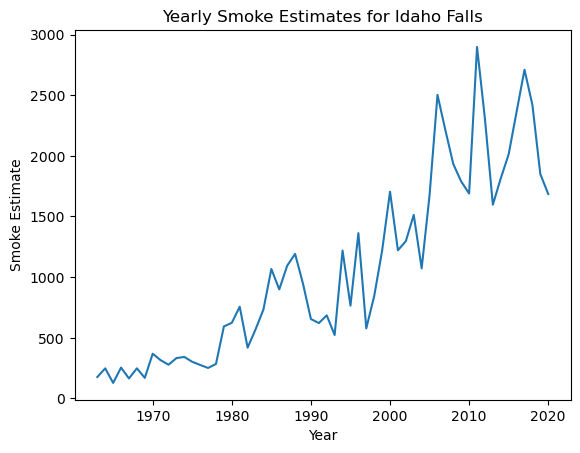

In [519]:
plt.plot(smoke_est)
plt.xlabel('Year')
plt.ylabel('Smoke Estimate')
plt.title('Yearly Smoke Estimates for Idaho Falls')
plt.show()

## Getting AQI Data
Now that we have calculated a smoke estimate for Idaho Falls each year, we want to compare this with the Air Quality Index (AQI) over time. To get the AQI data, we will perform several API calls to get daily AQI estimates for Idaho Falls.

<b>Note:</b> AQI data for Idaho Falls only goes back to 1989, as that is the first year that AQI sensors were recording data in Bonneville County

### Create a Function to Request Daily Summary
Before we can perform API calls, we need to define a function that gets a summary of the AQI information for individual dates. The following function was produced by Dr. David McDonald, and I am reusing this code under the Creative Commons CC-BY License.

In [6]:
#
#    This implements the daily summary request. Daily summary provides a daily summary value for each sensor being requested
#    from the start date to the end date. 
#
#    This can be called with a mixture of a defined parameter dictionary, or with function parameters. If function
#    parameters are provided, those take precedence over any parameters from the request template.
#
def request_daily_summary(email_address = None, key = None, param=None,
                          begin_date = None, end_date = None, fips = None,
                          endpoint_url = API_REQUEST_URL, 
                          endpoint_action = API_ACTION_DAILY_SUMMARY_COUNTY, 
                          request_template = AQS_REQUEST_TEMPLATE,
                          headers = None):
    
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    if param:
        request_template['param'] = param
    if begin_date:
        request_template['begin_date'] = begin_date
    if end_date:
        request_template['end_date'] = end_date
    if fips and len(fips)==5:
        request_template['state'] = fips[:2]
        request_template['county'] = fips[2:]            

    # Make sure there are values that allow us to make a call - these are always required
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_daily_summary()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_daily_summary()'")
    if not request_template['param']: 
        raise Exception("Must supply param values to call 'request_daily_summary()'")
    if not request_template['begin_date']: 
        raise Exception("Must supply a begin_date to call 'request_daily_summary()'")
    if not request_template['end_date']: 
        raise Exception("Must supply an end_date to call 'request_daily_summary()'")
    # Note we're not validating FIPS fields because not all of the daily summary actions require the FIPS numbers
        
    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

### Perform API Calls to Retrieve Daily Summaries Each Year

Now we use the function that we just created to get daily summaries of AQI data for each year in Idaho Falls

In [7]:
# We will initialize our request by updating our request template with the specified constants
request_data = AQS_REQUEST_TEMPLATE.copy()
request_data['email'] = USERNAME
request_data['key'] = APIKEY
request_data['state'] = ASSIGNED_CITY['fips'][:2]
request_data['county'] = ASSIGNED_CITY['fips'][2:]

aqi_data = list() # We will store our results into a list of dictionaries
for year in range(1963, 2024):
    # Create a string for the date. We are only concerned about AQI levels during the wildfire season, hence we will
    # be restricting our date range for each year
    may1 = str(year) + '0501'
    oct31 = str(year) + '1031'
    # request daily summary data for the whole wildfire season (using the gaseous parameters)
    request_data['param'] = AQI_PARAMS_GASEOUS
    gaseous_aqi = request_daily_summary(request_template=request_data, begin_date=may1, end_date=oct31)
    print(f"Response for the gaseous pollutants in {year}...")
    #
    if gaseous_aqi["Header"][0]['status'] == "Success":
        print(json.dumps(gaseous_aqi['Data'],indent=4))
        for record in gaseous_aqi['Data']:
            aqi_data.append({'Site_Number': record['site_number'],
                             'Site_Address': record['site_address'],
                             'State': record['state'],
                             'County': record['county'],
                             'City': record['city'],
                             'Parameter': record['parameter'],
                             'Sample_Duration': record['sample_duration'],
                             'Date': record['date_local'],
                             'AQI': record['aqi']})
    elif gaseous_aqi["Header"][0]['status'].startswith("No data "):
        print("Looks like the response generated no data. You might take a closer look at your request and the response data.")
    else:
        print(json.dumps(gaseous_aqi,indent=4))
        for record in gaseous_aqi:
            aqi_data.append({'Site_Number': record['site_number'],
                             'Site_Address': record['site_address'],
                             'State': record['state'],
                             'County': record['county'],
                             'City': record['city'],
                             'Parameter': record['parameter'],
                             'Sample_Duration': record['sample_duration'],
                             'Date': record['date_local'],
                             'AQI': record['aqi']})

    # request daily summary data for the whole wildfire season (using the particulate parameters)
    request_data['param'] = AQI_PARAMS_PARTICULATES
    particulate_aqi = request_daily_summary(request_template=request_data, begin_date=may1, end_date=oct31)
    print(f"Response for the particulate pollutants in {year}...")
    #
    if particulate_aqi["Header"][0]['status'] == "Success":
        print(json.dumps(particulate_aqi['Data'],indent=4))
        for record in particulate_aqi['Data']:
            aqi_data.append({'Site_Number': record['site_number'],
                             'Site_Address': record['site_address'],
                             'State': record['state'],
                             'County': record['county'],
                             'City': record['city'],
                             'Parameter': record['parameter'],
                             'Sample_Duration': record['sample_duration'],
                             'Date': record['date_local'],
                             'AQI': record['aqi']})
    elif particulate_aqi["Header"][0]['status'].startswith("No data "):
        print("Looks like the response generated no data. You might take a closer look at your request and the response data.")
    else:
        print(json.dumps(particulate_aqi,indent=4))
        for record in particulate_aqi:
            aqi_data.append({'Site_Number': record['site_number'],
                             'Site_Address': record['site_address'],
                             'State': record['state'],
                             'County': record['county'],
                             'City': record['city'],
                             'Parameter': record['parameter'],
                             'Sample_Duration': record['sample_duration'],
                             'Date': record['date_local'],
                             'AQI': record['aqi']})

Response for the gaseous pollutants in 1963...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1963...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 1964...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1964...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 1965...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1965...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 1

Response for the gaseous pollutants in 1989...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1989...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0005",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.483247,
        "longitude": -112.000803,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1989-05-04",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 24.0,
        "first_max_value": 24.0,
        "first_max_hour": 0,
        "aqi": 22,
        "method_code": "063

Response for the gaseous pollutants in 1990...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1990...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0005",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.483247,
        "longitude": -112.000803,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1990-05-05",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 23.0,
        "first_max_value": 23.0,
        "first_max_hour": 0,
        "aqi": 21,
        "method_code": "063

Response for the gaseous pollutants in 1991...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1991...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0005",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.483247,
        "longitude": -112.000803,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1991-06-05",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 17.0,
        "first_max_value": 17.0,
        "first_max_hour": 0,
        "aqi": 16,
        "method_code": "063

Response for the gaseous pollutants in 1992...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1992...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0005",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.483247,
        "longitude": -112.000803,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1992-05-06",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 57.0,
        "first_max_value": 57.0,
        "first_max_hour": 0,
        "aqi": 52,
        "method_code": "063

Response for the gaseous pollutants in 1993...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1993...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0005",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.483247,
        "longitude": -112.000803,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1993-05-01",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 29.0,
        "first_max_value": 29.0,
        "first_max_hour": 0,
        "aqi": 27,
        "method_code": "063

Response for the gaseous pollutants in 1994...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1994...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 1995...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1995...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0006",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.480378,
        "longitude": -112.044246,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1995-05-03",
        "units_of_meas

Response for the gaseous pollutants in 1996...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1996...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0006",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.480378,
        "longitude": -112.044246,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1996-05-03",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 45.0,
        "first_max_value": 45.0,
        "first_max_hour": 0,
        "aqi": 42,
        "method_code": "063

Response for the gaseous pollutants in 1997...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1997...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0006",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.480378,
        "longitude": -112.044246,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1997-05-04",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 56.0,
        "first_max_value": 56.0,
        "first_max_hour": 0,
        "aqi": 51,
        "method_code": "063

Response for the gaseous pollutants in 1998...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1998...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0006",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.480378,
        "longitude": -112.044246,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1998-05-05",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 26.0,
        "first_max_value": 26.0,
        "first_max_hour": 0,
        "aqi": 24,
        "method_code": "063

Response for the gaseous pollutants in 1999...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 1999...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0006",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.480378,
        "longitude": -112.044246,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "1999-05-26",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 21.0,
        "first_max_value": 21.0,
        "first_max_hour": 0,
        "aqi": 19,
        "method_code": "063

Response for the gaseous pollutants in 2000...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2000...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0010",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.499358,
        "longitude": -112.014971,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "2000-05-06",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 13.0,
        "first_max_value": 13.0,
        "first_max_hour": 0,
        "aqi": 12,
        "method_code": "063

Response for the gaseous pollutants in 2001...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2001...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0010",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.499358,
        "longitude": -112.014971,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "2001-05-02",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 14.0,
        "first_max_value": 14.0,
        "first_max_hour": 0,
        "aqi": 13,
        "method_code": "063

Response for the gaseous pollutants in 2002...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2002...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0010",
        "parameter_code": "81102",
        "poc": 1,
        "latitude": 43.499358,
        "longitude": -112.014971,
        "datum": "WGS84",
        "parameter": "PM10 Total 0-10um STP",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM10 24-hour 2006",
        "date_local": "2002-05-02",
        "units_of_measure": "Micrograms/cubic meter (25 C)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 24.0,
        "first_max_value": 24.0,
        "first_max_hour": 0,
        "aqi": 22,
        "method_code": "063

Response for the gaseous pollutants in 2003...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2003...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88101",
        "poc": 1,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "PM2.5 - Local Conditions",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM25 24-hour 2006",
        "date_local": "2003-05-06",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 5.1,
        "first_max_value": 5.1,
        "first_max_hour": 0,
        "aqi": 21,
        "method_code": "118",
 

Response for the gaseous pollutants in 2004...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2004...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0013",
        "parameter_code": "88101",
        "poc": 1,
        "latitude": 43.518267,
        "longitude": -112.020708,
        "datum": "WGS84",
        "parameter": "PM2.5 - Local Conditions",
        "sample_duration_code": "7",
        "sample_duration": "24 HOUR",
        "pollutant_standard": "PM25 24-hour 2006",
        "date_local": "2004-05-03",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 1,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 6.8,
        "first_max_value": 6.8,
        "first_max_hour": 0,
        "aqi": 28,
        "method_code": "117"

Response for the gaseous pollutants in 2005...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2005...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0013",
        "parameter_code": "88502",
        "poc": 3,
        "latitude": 43.518267,
        "longitude": -112.020708,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2005-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.4125,
        "first_max_value": 5.7,
        "first_max_hour": 20,
        "aqi": null,
        "method_code": 

Response for the gaseous pollutants in 2006...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2006...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0013",
        "parameter_code": "88502",
        "poc": 3,
        "latitude": 43.518267,
        "longitude": -112.020708,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2006-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 22,
        "observation_percent": 92.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 7.0,
        "first_max_value": 15.7,
        "first_max_hour": 15,
        "aqi": null,
        "method_code": "70

Response for the gaseous pollutants in 2007...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2007...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0013",
        "parameter_code": "88502",
        "poc": 3,
        "latitude": 43.518267,
        "longitude": -112.020708,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2007-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 14,
        "observation_percent": 58.0,
        "validity_indicator": "N",
        "arithmetic_mean": 9.45,
        "first_max_value": 16.7,
        "first_max_hour": 3,
        "aqi": null,
        "method_code": "70

Response for the gaseous pollutants in 2008...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2008...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0013",
        "parameter_code": "88502",
        "poc": 3,
        "latitude": 43.518267,
        "longitude": -112.020708,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2008-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 15,
        "observation_percent": 63.0,
        "validity_indicator": "N",
        "arithmetic_mean": -1.9,
        "first_max_value": 3.5,
        "first_max_hour": 12,
        "aqi": null,
        "method_code": "70

Response for the gaseous pollutants in 2009...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2009...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 2010...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2010...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 2011...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2011...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the gaseous pollutants in 2

Response for the gaseous pollutants in 2016...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2016...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2016-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 22,
        "observation_percent": 92.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.545455,
        "first_max_value": 11.0,
        "first_max_hour": 9,
        "aqi": null,
        "method_code": "7

Response for the gaseous pollutants in 2017...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2017...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2017-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.25,
        "first_max_value": 8.0,
        "first_max_hour": 12,
        "aqi": null,
        "method_code": "731"

Response for the gaseous pollutants in 2018...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2018...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2018-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.0,
        "first_max_value": 11.0,
        "first_max_hour": 20,
        "aqi": null,
        "method_code": "731"

Response for the gaseous pollutants in 2019...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2019...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2019-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 5.458333,
        "first_max_value": 9.0,
        "first_max_hour": 20,
        "aqi": null,
        "method_code": "

Response for the gaseous pollutants in 2020...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2020...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2020-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 3.875,
        "first_max_value": 7.0,
        "first_max_hour": 20,
        "aqi": null,
        "method_code": "731

Response for the gaseous pollutants in 2021...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2021...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2021-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "Events Included",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.375,
        "first_max_value": 10.0,
        "first_max_hour": 15,
        "aqi": null,
        "method_code

Response for the gaseous pollutants in 2022...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2022...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2022-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 24,
        "observation_percent": 100.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 4.125,
        "first_max_value": 9.0,
        "first_max_hour": 6,
        "aqi": null,
        "method_code": "731"

Response for the gaseous pollutants in 2023...
Looks like the response generated no data. You might take a closer look at your request and the response data.
Response for the particulate pollutants in 2023...
[
    {
        "state_code": "16",
        "county_code": "019",
        "site_number": "0011",
        "parameter_code": "88502",
        "poc": 4,
        "latitude": 43.4647,
        "longitude": -112.04645,
        "datum": "WGS84",
        "parameter": "Acceptable PM2.5 AQI & Speciation Mass",
        "sample_duration_code": "1",
        "sample_duration": "1 HOUR",
        "pollutant_standard": null,
        "date_local": "2023-05-01",
        "units_of_measure": "Micrograms/cubic meter (LC)",
        "event_type": "No Events",
        "observation_count": 23,
        "observation_percent": 96.0,
        "validity_indicator": "Y",
        "arithmetic_mean": 3.869565,
        "first_max_value": 19.0,
        "first_max_hour": 10,
        "aqi": null,
        "method_code": "

### Create the AQI estimates
We have extracted the AQI data, and now we need to clean up the data and then perform some aggregations to get our desired AQI estimates for Idaho Falls.

In [465]:
# Convert the data into a DataFrame object, then eliminate any null values from the 'AQI' column
aqi_df = pd.DataFrame(aqi_data)
aqi_df = aqi_df.dropna(subset=['AQI'])
aqi_df

,Site_Number,Site_Address,State,County,City,Parameter,Sample_Duration,Date,AQI
0,0005,CORNER 6HT & N LEE ST.,Idaho,Bonneville,Idaho Falls,PM10 Total 0-10um STP,24 HOUR,1989-05-04,22.0
1,0005,CORNER 6HT & N LEE ST.,Idaho,Bonneville,Idaho Falls,PM10 Total 0-10um STP,24 HOUR,1989-05-10,42.0
2,0005,CORNER 6HT & N LEE ST.,Idaho,Bonneville,Idaho Falls,PM10 Total 0-10um STP,24 HOUR,1989-05-16,13.0
3,0005,CORNER 6HT & N LEE ST.,Idaho,Bonneville,Idaho Falls,PM10 Total 0-10um STP,24 HOUR,1989-05-22,32.0
4,0005,CORNER 6HT & N LEE ST.,Idaho,Bonneville,Idaho Falls,PM10 Total 0-10um STP,24 HOUR,1989-05-28,23.0
...,...,...,...,...,...,...,...,...,...
6018,0011,"HICKORY AND SYCAMORE ST, IDAHO FALLS",Idaho,Bonneville,Idaho Falls,Acceptable PM2.5 AQI & Speciation Mass,24-HR BLK AVG,2023-06-26,18.0
6020,0011,"HICKORY AND SYCAMORE ST, IDAHO FALLS",Idaho,Bonneville,Idaho Falls,Acceptable PM2.5 AQI & Speciation Mass,24-HR BLK AVG,2023-06-27,15.0
6022,0011,"HICKORY AND SYCAMORE ST, IDAHO FALLS",Idaho,Bonneville,Idaho Falls,Acceptable PM2.5 AQI & Speciation Mass,24-HR BLK AVG,2023-06-28,16.0
6024,0011,"HICKORY AND SYCAMORE ST, IDAHO FALLS",Idaho,Bonneville,Idaho Falls,Acceptable PM2.5 AQI & Speciation Mass,24-HR BLK AVG,2023-06-29,28.0


In [466]:
# Extract the year from each date in the dataset
aqi_df['Year'] = pd.to_datetime(aqi_df['Date']).dt.year

In [524]:
# Now we can get an average AQI estimate for each year
yearly_aqi = aqi_df.groupby('Date').agg({'AQI':'mean', 'Year':'min'}).groupby('Year')['AQI'].mean()
yearly_aqi

Year
1989    24.064516
1990    23.076923
1991    29.086957
1992    33.296296
1993    29.259259
1995    25.258065
1996    33.322581
1997    27.225806
1998    25.033333
1999    23.396552
2000    25.959821
2001    18.893994
2002    23.665850
2003    24.771930
2004    20.500000
2005    22.090395
2006    24.264286
2007    31.307692
2008    21.600000
2015    14.073171
2016    30.089655
2017    34.215470
2018    39.148571
2019    28.829545
2020    32.109890
2021    38.823204
2022    24.630682
2023    22.773585
Name: AQI, dtype: float64

I have visualized this information in the plot below, to help get a better understanding of the AQI estimates over time.

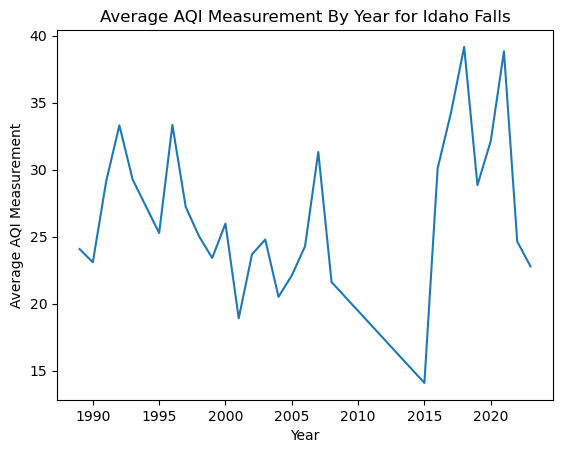

In [525]:
plt.plot(yearly_aqi)
plt.xlabel('Year')
plt.ylabel('Average AQI Measurement')
plt.title('Average AQI Measurement By Year for Idaho Falls')
plt.show()

## Developing a Model to Predict Smoke Estimates

We want to create a model that can predict our smoke estimate for the next 25 years. I have decided to use an ARIMA model, as it is useful for time series forecasting. To account for the variability in the data, I have chosen a model that has a relatively small AIC estimate compared to other models, which is deemed as a useful indicator of how well the model fits the data. After creating a model, I plot a graph showing my smoke estimates, and the forecasted values (along with their associated upper and lower bounds).

In [460]:
# I have tested out various parameters, and this combination seems to output the lowest AIC. You can choose to
# approach this systematically as well.
model = ARIMA(smoke_est['Smoke_Estimate'], order=(1, 2, 5))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:         Smoke_Estimate   No. Observations:                   58
Model:                 ARIMA(1, 2, 5)   Log Likelihood                -404.310
Date:                Wed, 08 Nov 2023   AIC                            822.621
Time:                        19:34:09   BIC                            836.798
Sample:                             0   HQIC                           828.118
                                 - 58                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3460      0.474      0.729      0.466      -0.584       1.275
ma.L1         -1.8454      0.490     -3.762      0.000      -2.807      -0.884
ma.L2          0.7240      0.760      0.953      0.3

In [461]:
# Since our wildfire data only goes up to 2020, we will make predictions for 2021 to 2049
forecast = model_fit.get_forecast(29)
confint = forecast.conf_int(alpha=0.05) # This extracts the lower and upper estimates for each prediction
confint['predicted_value'] = forecast.predicted_mean
confint[['lower Smoke_Estimate', 'predicted_value', 'upper Smoke_Estimate']]

,lower Smoke_Estimate,predicted_value,upper Smoke_Estimate
58,1488.451576,2109.271265,2730.090954
59,1600.607813,2299.473859,2998.339905
60,1558.935205,2272.248452,2985.561699
61,1473.640436,2200.269073,2926.897710
62,1416.453322,2196.753693,2977.054063
63,1366.454322,2216.923594,3067.392866
64,1321.619926,2245.287474,3168.955023
65,1280.942567,2276.486081,3272.029596
66,1243.568801,2308.665368,3373.761935
67,1208.854859,2341.183924,3473.512989


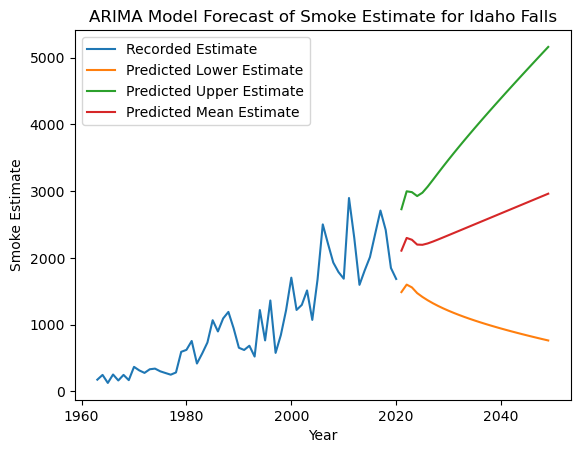

In [517]:
plt.plot(smoke_est)
# We want to range the predicted values over the time span of 2021-2049
plt.plot(range(2021, 2050), confint)
plt.xlabel('Year')
plt.ylabel('Smoke Estimate')
# Create a legend to help distinguish between the different estimate parameters
plt.legend(['Recorded Estimate', 'Predicted Lower Estimate', 'Predicted Upper Estimate', 'Predicted Mean Estimate'])
plt.title('ARIMA Model Forecast of Smoke Estimate for Idaho Falls')
plt.show()

## Visualizing our Findings

While I have done some exploratory data analysis when I was examining the smoke estimates and the AQI measures, let's take a look at other perspectives of the data.

### Number of Fires by Distance

How many fires have occurred near Idaho Falls? Do most tend to be closer or further away from it? This kind of information could reveal whether or not Idaho Falls is in a hazardous zone and give insight on where most wildfires are occuring.

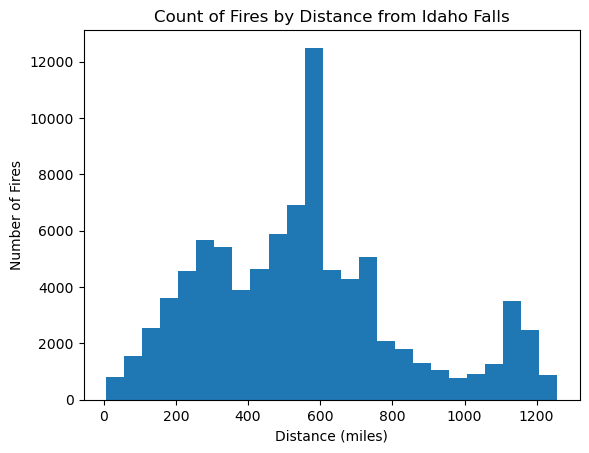

In [520]:
# We want to make our bin sizes 50 mile increments, so we specify the bin size in the hist() function
plt.hist(df['Distance_(mi)'], bins=np.arange(min(df['Distance_(mi)']), max(df['Distance_(mi)']) + 50, 50))
plt.xlabel('Distance (miles)')
plt.ylabel('Number of Fires')
plt.title('Count of Fires by Distance from Idaho Falls')
plt.savefig('FireCount.png') # Save to PNG File
plt.show()

The distribution of fire events seems to be somewhat normally distributed, centered around 600 miles, although there is a slight skew to the right, meaning more fires have occurred less than 600 miles from Idaho Falls, than fires further than 600 miles. This is about what I expected for this area, since I know that many wildfires occur near this region.

### Total Acres Burned Per Year
If we want to measure the impact that fires have over time, we should take a look at how destructive they have been. Has there been an increase in acres burned each year? I will create a time series graph to show how the number of acres burned has changed over the years.

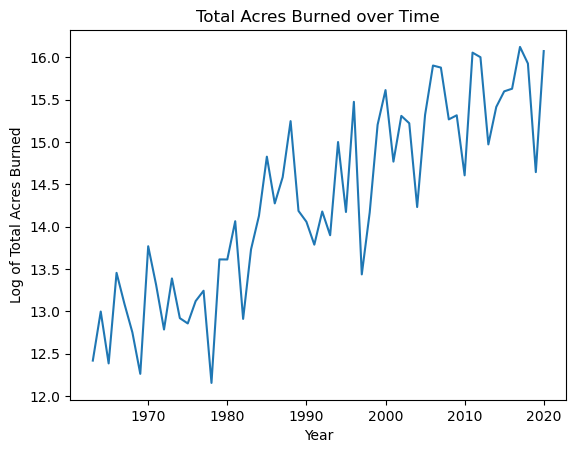

In [521]:
# Since the total number of acres ranges over three different orders of magnitude, it is better to transform the data
# using logarithmic units
log_acres_per_year = np.log(df.groupby('Year')['Acres'].sum())
plt.plot(log_acres_per_year)
plt.xlabel('Year')
plt.ylabel('Log of Total Acres Burned')
plt.title('Total Acres Burned over Time')
plt.savefig('TotalAcres.png') # Save to PNG file
plt.show()

From this data, it is very clear that fires have gotten bigger and more numerous over the years. However, what's interesting is that despite the increase, there seems to be a regularity of "down years" approximately every 5 years. I'm not sure if this is natural variance, or if there is a systematic reason for these highs and lows.

### Smoke Estimate vs AQI Estimate
Do the trends with my smoke estimate correspond to the trends of the overall AQI estimate? Let's compare them and see what they show:

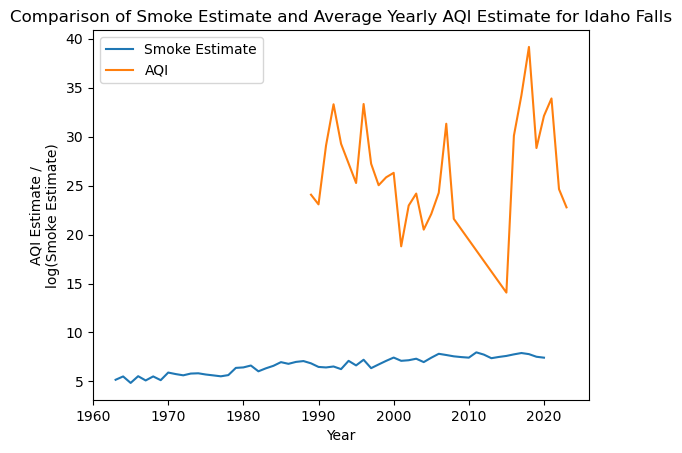

In [523]:
# In order to visualize both the smoke estimate and the AQI on the same plot, I took the log of my smoke estimate
plt.plot(np.log(smoke_est))
plt.plot(yearly_aqi)
plt.legend(['Smoke Estimate', 'AQI'])
plt.xlabel('Year')
# The y-axis represents two different units, so I am specifying both units on this axis
plt.ylabel('AQI Estimate /\nlog(Smoke Estimate)')
plt.title('Comparison of Smoke Estimate and Average Yearly AQI Estimate for Idaho Falls')
plt.savefig('SmokeVsAQITimeSeries.png', bbox_inches='tight') # Save the figure to a PNG file with tight padding
plt.show()

Interestingly, the AQI estimates do not seem to have a particular trend, which is different from my smoke estimates. This may be due to the fact that I am taking an average. It's possible that AQI levels have not drastically changed much since they first started being tracked, but the amount of unhealthy days may be higher due to more wildfires. My smoke estimates inherently took into account the amount of instances, while my AQI estimates do not. Since we do not have data every day of every year, nor do we have a consistent amount each year, it is difficult to compare the overall impact across each year using only the AQI estimate. Furthermore, not every city needs to report AQI measurements, and there could be a selection bias, since places that have lower AQIs are not required to report their measurements.